# CARS User Day

In this tutorial, various open-source software developed by CNES for 3D reconstruction will be explored. However, the main focus will be on CARS, with the use of the other softwares being optional. This tutorial was set up on the occasion of the release of version 1.0 of CARS and in particular the training day: CARS User Day (30/01/2026).


- **CARS** is the software for producing digital surface models (DSM) from pairs of satellite images. It produces both rasters (2.5D representation created from observed surface altitude data) and point clouds.

- **Bulldozer** removes above-ground elements (trees, buildings, etc.) from the DSMs to produce Digital Terrain Models (DTMs).

- **SLURP** allows the production of land cover masks particularly useful for CARS, such as water masks to avoid unnecessary calculations on water areas by CARS.

- **xDEM** is the software for analyzing the 3D models produced by CARS and Bulldozer. It is particularly useful for comparing the models produced with reference data such as LiDAR HD, for example.

The tutorial will focus on two areas around Toulouse: ROI_INDUS, an industrial area, and ROI_STADIUM, the area around the Toulouse stadium, which is located on an island surrounded by the Garonne. A tri-stereo from the Pléiades satellite will be used to produce the DSMs. The results obtained will then be compared with LiDAR HD produced by the IGN.

## Prerequisites: Installation

### Download softwares

#### CARS software

In [2]:
!python --version

Python 3.12.12


In [3]:
pip install cars==1.0.0-rc3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.0/97.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 55.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.2/122.2 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.6/110.6 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 350.8/350.8 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.0/207.0 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.1/177.1 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/6

In [1]:
!cars --version

cars 1.0.0rc3


In [2]:
!cars -h

usage: cars [-h] [--loglevel {DEBUG,INFO,PROGRESS,WARNING,ERROR,CRITICAL}]
            [--version]
            conf

CARS: CNES Algorithms to Reconstruct Surface

positional arguments:
  conf                  Inputs Configuration File

options:
  -h, --help            show this help message and exit
  --loglevel {DEBUG,INFO,PROGRESS,WARNING,ERROR,CRITICAL}
                        Logger level (default: WARNING. Should be one of
                        (DEBUG, INFO, PROGRESS, WARNING, ERROR, CRITICAL)
  --version, -v         show program's version number and exit


#### Bulldozer software

Bulldozer software is a dependency in CARS. Therefore, it is possible to directly import Bulldozer.




In [46]:
import bulldozer
print(bulldozer.__version__)

1.2.0a


In [54]:
!bulldozer -lu

Bulldozer: CNES pipeline designed to extract DTM from DSM

Usage with config file: bulldozer [-h] [-v] [-lu] [-ex] config_path

positional arguments:
  config_path                                        Input configuration file.

options:
  -h, --help                                         Show short help message and exit.
  -v, --version                                      Show program's version number and exit.
  -lu, --long_usage                                  Show complete help message and exit.
  -ex, --expert_mode                                 Show complete help message with expert parameters and exit.

If extra arguments are provided, these will override the original values from the configuration file.

---------------------------------

Usage with parameters: bulldozer [-h] [-v] [-lu] [-ex]
                                 [-dhm] [-max_size <value>] [-ground <mask.tif>] 
                                 [-anchors] [-workers <value>] [-dev] 
                               

If you want a specific version, we can run:

```
!pip install bulldozer-dtm==specific-version
```



#### xDEM software


xDEM software is a dependency in CARS. Therefore, it is possible to directly import xDEM.

In [ ]:
import xdem
print(xdem.__version__)

0.2.1


If you want a specific version we can run:

```
!pip install xdem==specific-version
```



#### SLURP software (optional)

SLURP is not a CARS's dependency, you need to install SLURP if you want to compute land cover maps.

In [ ]:
!pip install slurp-masks==0.0.4

  Using cached argparse-1.4.0-py2.py3-none-any.whl.metadata (2.8 kB)
Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


### Useful functions

#### Display function

In [10]:
import numpy as np

def normalize(array, quantile=2):
    """
    normalizes bands into 0-255 scale
    :param array: numpy array to normalize
    :param quantile: quantile for ignoring outliers
    """
    array = np.nan_to_num(array)
    array_min, array_max = np.percentile(array, quantile), np.percentile(array, 100-quantile)
    normalized = 255*((array - array_min)/(array_max - array_min))
    normalized[normalized>255] = 255
    normalized[normalized<0] = 0
    return normalized.astype(np.uint8)

### Download data

In [ ]:
# Add code to download data

#### ROI STADIUM

This area is around the Toulouse stadium, which is located on an island surrounded by the Garonne. Firstly, the focus is on the tri-stereo Pléiades images (28/06/2022)

*Pléiades data can be downloaded using the web site [DINAMIS](https://dinamis.data-terra.org/)*

Display of the tri-stereo Pléiades images for the panchromatic band with a 50 cm spatial resolution:

In [ ]:
from matplotlib import pyplot
import rasterio
from rasterio.plot import show
import os

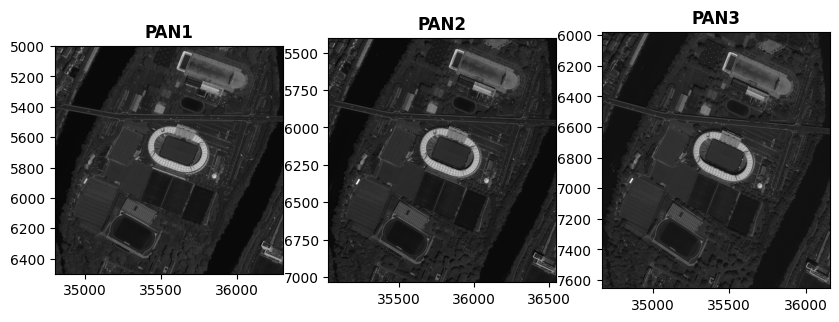

In [ ]:
path_stadium = "ROI_STADIUM/"
fig, axs = pyplot.subplots(1, 3, figsize=(10,10))

for idx in range(3):
    with rasterio.open(path_stadium+"img"+str(idx+1)+"/PAN.tif") as src:
        show((src), ax=axs[idx], cmap='gray', title="PAN"+str(idx+1))

The multispectral images from Pléiades have a 2m spatial resolution. A process was applied to merge the panchromatic (PAN) and multispectral data with 4 bands RGB NIR (MS) to obtain a PXS image at 50cm. It is called pansharpening. You can use the OTB to compute it: `otbcli_BundleToPerfectSensor -method bayes -inp PANCHROMATIC_IMAGE -inxs MS_IMAGE -out PXS_IMAGE uint16`. Therefore, you can display the PXS at 50cm :

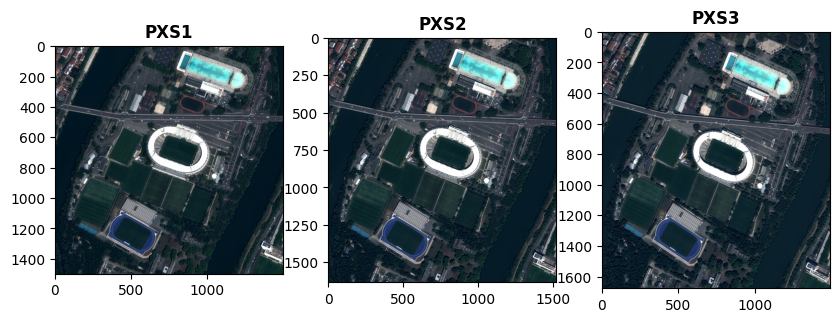

In [ ]:
path_stadium = "ROI_STADIUM/"
fig, axs = pyplot.subplots(1, 3, figsize=(10,10))

for idx in range(3):
    with rasterio.open(path_stadium+"img"+str(idx+1)+"/PXS.tif") as src:
        show(normalize(src.read([1,2,3])/2**12), ax=axs[idx],title="PXS"+str(idx+1))

Sentinel-2 image (29/06/2022)

*Sentinel-2 data can be downloaded using the web site [Geodes](https://geodes-portal.cnes.fr/)*

Sentinel-2 image has a 20m spatial resolution.

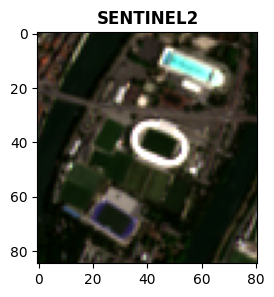

In [ ]:
path_stadium = "ROI_STADIUM/"
fig, axs = pyplot.subplots(1, 1, figsize=(3,3))

with rasterio.open(path_stadium+"/SENTINEL2.tif") as src:
    show(normalize(src.read([1,2,3])/2**12),title="SENTINEL2")

#### ROI INDUSTRIAL ZONE

This area is an industrial area is the south west of Toulouse. It is the same tri-stereo Pléiades images (28/06/2022)

*Pléiades data can be downloaded using the web site [DINAMIS](https://dinamis.data-terra.org/)*

In [7]:
from matplotlib import pyplot
import rasterio
from rasterio.plot import show
import os

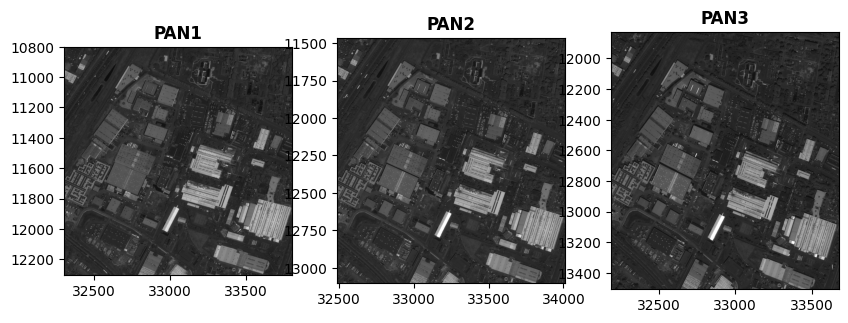

In [8]:
path_indus = "ROI_INDUS/"
fig, axs = pyplot.subplots(1, 3, figsize=(10,10))

for idx in range(3):
    with rasterio.open(path_indus+"img"+str(idx+1)+"/PAN.tif") as src:
        show((src), ax=axs[idx], cmap='gray', title="PAN"+str(idx+1))

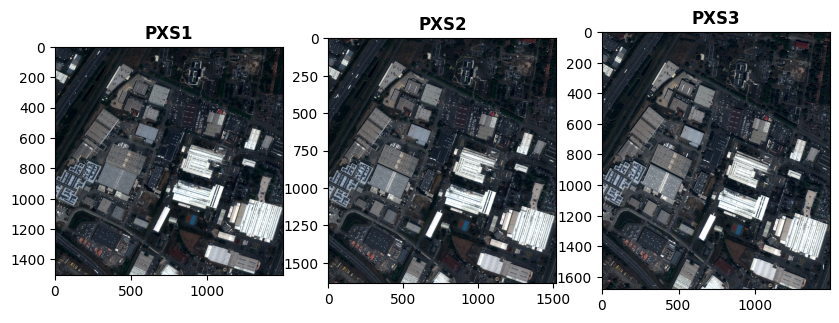

In [11]:
path_indus = "ROI_INDUS/"
fig, axs = pyplot.subplots(1, 3, figsize=(10,10))

for idx in range(3):
    with rasterio.open(path_indus+"img"+str(idx+1)+"/PXS.tif") as src:
        show((normalize(src.read([1,2,3])/2**12)), ax=axs[idx], title="PXS"+str(idx+1))

Sentinel-2 image (29/06/2022)


*Sentinel-2 data can be downloaded using the web site [Geodes](https://geodes-portal.cnes.fr/)*

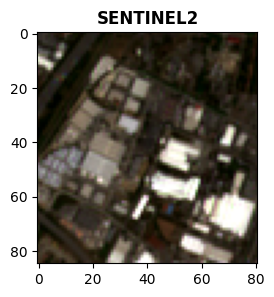

In [12]:
path_stadium = "ROI_INDUS/"
fig, axs = pyplot.subplots(1, 1, figsize=(3,3))

with rasterio.open(path_stadium+"/SENTINEL2.tif") as src:
    show(normalize(src.read([1,2,3])/2**12),title="SENTINEL2")

## Part 0 (Optionnal) : Generate Land Cover Map with satellite images

Using the SLURP library : https://github.com/CNES/slurp

### Launch SLURP - Python CLI

We will generate land cover maps with SLURP on ROI_STADIUM because there is some water.

#### Prepare step

We will do the process only for img1, but you can do it for the 3 images

In [27]:
path_STADIUM_img1 = "ROI_STADIUM/img1/"

This step prepares all the auxiliary data required to calculate the masks.

In [ ]:
!cd $path_STADIUM_img1 ; slurp_prepare ../../main_config_slurp.json -file_vhr PXS.tif --no_analyse_glcm

INFO: ----------------------------------------------------------------------------------------------------
INFO: SLURP - Prepare step

INFO: JSON data loaded: ../../main_config.json
call n_images_to_m_images_filter
Valid stack processing...: 100% 9/9 [00:13<00:00,  1.51s/it]
call n_images_to_m_images_filter
NDVI processing...: 100% 9/9 [00:23<00:00,  2.63s/it]
call n_images_to_m_images_filter
NDWI processing...: 100% 9/9 [00:14<00:00,  1.60s/it]
call n_images_to_m_images_filter
Texture processing...: 100% 9/9 [00:16<00:00,  1.88s/it]
INFO: Total time (user)       :	00:01:21
INFO: End of prepare step



such as the NDVI, the NDWI and the texture:

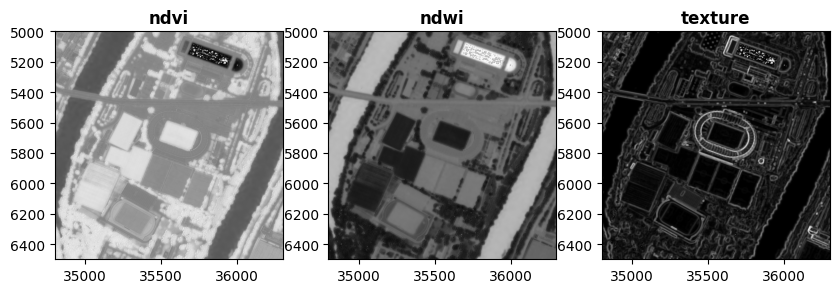

In [ ]:
path_out = path_STADIUM_img1 + "out/"

fig, axs = pyplot.subplots(1, 3, figsize=(10,10))

with rasterio.open(path_out+"ndvi.tif") as src:
    show((src), ax=axs[0],cmap='gray', title="ndvi")

with rasterio.open(path_out+"ndwi.tif") as src:
    show((src), ax=axs[1], cmap='gray', title="ndwi")

with rasterio.open(path_out+"texture.tif") as src:
    show((src), ax=axs[2], cmap='gray', title="texture")

#### Watermask step

Generate the watermask

In [ ]:
!cd $path_STADIUM_img1 ; slurp_watermask out/effective_used_config.json

Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
INFO: ----------------------------------------------------------------------------------------------------
SLURP - Water mask
JSON data loaded: out/effective_used_config.json
call n_images_to_m_images_filter
Pekel valid mask processing...:   0% 0/9 [00:00<?, ?it/s]Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)

#### Vegetation mask step

Generate the vegetation mask

In [ ]:
!cd $path_STADIUM_img1; slurp_vegetationmask out/effective_used_config.json

INFO: ----------------------------------------------------------------------------------------------------
INFO: SLURP - Vegetation mask

INFO: JSON data loaded: out/effective_used_config.json
call n_images_to_m_images_filter
Segmentation processing...: 100% 9/9 [00:19<00:00,  2.17s/it]
Stats : 100% 9/9 [00:24<00:00,  2.71s/it]
call n_images_to_m_images_filter
Finalize processing (Cython)...: 100% 9/9 [00:19<00:00,  2.19s/it]
call n_images_to_m_images_filter
Post-processing...: 100% 9/9 [00:16<00:00,  1.79s/it]
INFO: **** Vegetation mask for PXS.tif (saved as out/vegetationmask.tif) ****
INFO: Total time (user)       :	00:01:34
INFO: - Build_stack           :	00:00:00
INFO: - Segmentation          :	00:00:22
INFO: - Stats                 :	00:00:28
INFO: - Clustering            :	00:00:01
INFO: - Finalize Cython       :	00:00:22
INFO: - Post-processing       :	00:00:19
INFO: - Write final image     :	00:00:00
INFO: ***


#### Shadow mask step

Generate the shadow mask

In [ ]:
!cd $path_STADIUM_img1; slurp_shadowmask out/effective_used_config.json

INFO: ----------------------------------------------------------------------------------------------------
INFO: SLURP - Shadow mask

INFO: JSON data loaded: out/effective_used_config.json
call n_images_to_m_images_filter
Shadow mask processing...: 100% 9/9 [00:08<00:00,  1.05it/s]
INFO: **** Shadow mask for PXS.tif (saved as out/shadowmask.tif) ****
INFO: Total time (user)       :	00:00:10


#### Urban mask step

Generate the urban mask

In [ ]:
!cd $path_STADIUM_img1; slurp_urbanmask out/effective_used_config.json

Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
INFO: ----------------------------------------------------------------------------------------------------
INFO: SLURP - Urban mask

INFO: JSON data loaded: out/effective_used_config.json
call n_images_to_m_images_filter
Valid stack processing with vegetationmask...:   0% 0/9 [00:00<?, ?it/s]Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Valid stack processing with vegetationmask...:  11% 1/9 [00:15<02:02, 15.29s/it]Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Valid stack processing with vegetationmask...: 100% 9/9 [00:15<00:00,  1.75s/it]
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)
Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-int

#### Stack the masks

Stack all the mask together to obtain only one mask. Besides, add the option `categorized_watermask` to classify the water in 3 categories: Sea, Lake and River (based on the the Copernicus WaterBodyMask WBM).

In [ ]:
!cd $path_STADIUM_img1; slurp_stackmasks -categorized_watermask true out/effective_used_config.json

INFO: ----------------------------------------------------------------------------------------------------
INFO: SLURP - Stack masks

INFO: JSON data loaded: out/effective_used_config.json
call n_images_to_m_images_filter
Post processing...: 100% 9/9 [00:21<00:00,  2.35s/it]
INFO: **** Stack masks for PXS.tif (saved as out/stackmask.tif) ****
INFO: Total time (user)       :	00:00:23


Postprocess for CARS

Keep only the first band of the stack mask for CARS.

In [ ]:
with rasterio.open(path_STADIUM_img1+"out/stackmask.tif") as src:
  band1 = src.read(1)
with rasterio.open(path_STADIUM_img1+"out/stackmask_first_band.tif", mode='w', driver='GTiff',
                  height=band1.shape[0], width=band1.shape[1],
                  count=1, dtype=band1.dtype,
                  crs=src.crs, transform=src.transform) as dst:
    dst.write(band1, 1)

### Let's see the results

Masks

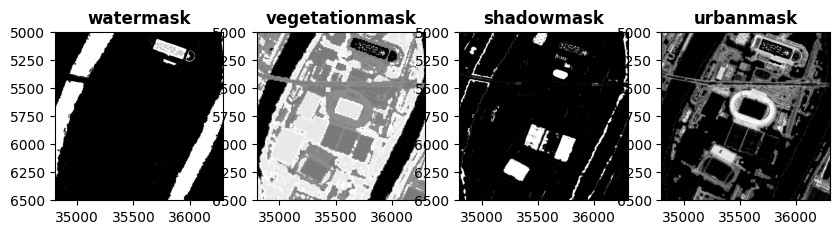

In [ ]:
path_out = path_STADIUM_img1 + "out/"

fig, axs = pyplot.subplots(1, 4, figsize=(10,10))

with rasterio.open(path_out+"watermask.tif") as src:
    show((src), ax=axs[0],cmap='gray', title="watermask")

with rasterio.open(path_out+"/vegetationmask.tif") as src:
    show((src), ax=axs[1], cmap='gray', title="vegetationmask")

with rasterio.open(path_out+"shadowmask.tif") as src:
    show((src), ax=axs[2], cmap='gray', title="shadowmask")

with rasterio.open(path_out+"urbanmask.tif") as src:
    show((src), ax=axs[3], cmap='gray', title="urbanmask")

Stack Mask

Plot stack mask without color style

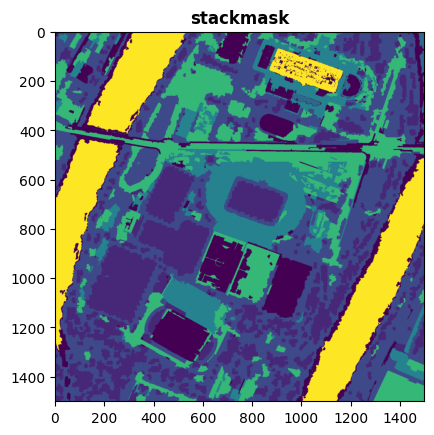

In [ ]:
path_out = path_STADIUM_img1 + "out/"
with rasterio.open(path_out+"stackmask_first_band.tif") as src:
    stackmask = src.read(1)
    stackmask[stackmask==255] = 0 # remove 255 value
    show(stackmask,title="stackmask")

Plot stack mask with color style

Use QGIS to plot your stack mask with color style using the file (`slurp_QGIS_raster_style.qml`)

In [ ]:
values_stackmask = np.unique(stackmask)
print(values_stackmask)

[0 1 2 3 4 6 9]


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm, Normalize

colors = [
    '#ffffff',  # inconnu (0)
    '#18df2f',  # Veg basse (1)
    '#0f7637',  # Veg haute (2)
    '#2895cb',  # Eau (3)
    '#ff0184',  # Bati (4)
    '#ddc823',  # Sol nu (6)
   # '#185880',  # Mer/Océan (7)
   # '#64ebe0',  # Lac (8)
    '#149ceb'   # Rivière (9)
]

stackmask_style = ListedColormap(colors, name='stackmask_style')
bounds = [ 1, 2, 3, 4, 5, 6, 7, 9]
#norm = Normalize(vmin=0, vmax=9)
norm = BoundaryNorm(bounds, stackmask_style.N)

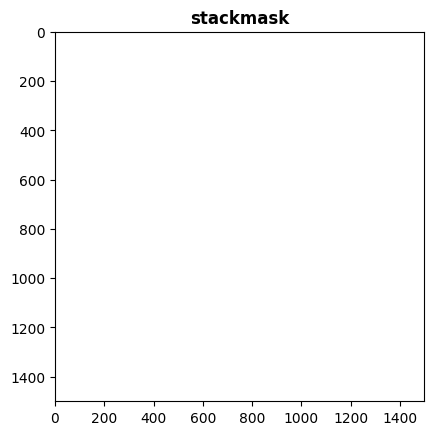

<Axes: title={'center': 'stackmask'}>

In [ ]:
show(stackmask, cmap= stackmask_style, norm=norm, title="stackmask")
pyplot.colorbar()

Compare with OSO Land Cover map 2022

In [31]:
%matplotlib inline


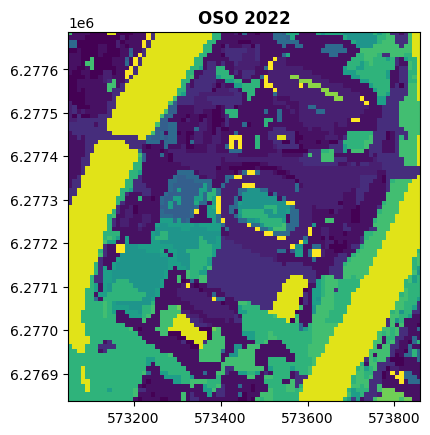

In [33]:
with rasterio.open("ROI_STADIUM/OSO2022.tif") as src:
    show(src, title="OSO 2022")

Use QGIS to plot the OSO with color style using the file (`oso_QGIS_raster_style_24.qml`)

In [35]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm, Normalize

colors = [
    '#ff00ff',  # Urbain dense (1)
    '#ff55ff',  # Urbain diffus (2)
    '#ffaaff',  # Zones industrielles et commerciales (3)
    '#00ffff',  # Routes (4)
    #'#ffff00',  # Colza (5)
    '#d0ff00',  # Céréales à paille (6)
    '#a1d600',  # Protéagineux (7)
    '#ffaa44',  # Soja (8)
    '#d6d600',  # Tournesol (9)
    '#ff5500',  # Maïs (10)
    '#c5ffff',  # Riz (11)
    '#aaaa61',  # Tubercules / Racines (12)
    '#aaaa00',  # Prairies (13)
    '#aaaaff',  # Vergers (14)
    '#550000',  # Vignes (15)
    '#009c00',  # Forêts de feuillus (16)
    '#003200',  # Forêts de conifères (17)
    '#aaff00',  # Pelouse (18)
    '#55aa7f',  # Landes (19)
    '#ff0000',  # Surfaces minérales (20)
    '#ffb802',  # Plages et Dunes (21)
    '#bebebe',  # Glaciers et neiges éternelles (22)
    '#0000ff',  # Eau (23)
    '#4479c8'   # Serres (24)
]

oso_style = ListedColormap(colors, name='oso_style')
bounds = [1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
norm = BoundaryNorm(bounds, oso_style.N)

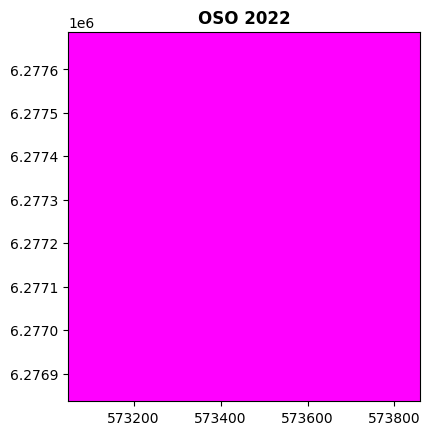

In [36]:
with rasterio.open("ROI_STADIUM/OSO2022.tif") as src:
    show((src), cmap= oso_style, norm=norm, title="OSO 2022")

## Part 1: Generate Digital Surface Models from sets of stereo satellite images

Using the CARS 3D reconstruction library : https://github.com/CNES/cars


### Part 1.1: Without land cover map: ROI_INDUS

In [13]:
path_indus = "ROI_INDUS/"

In [4]:
!rm -rf ROI_INDUS/DSM/

In [14]:
out= path_indus+"DSM/"

#### Create your configuration file

CARS minimal configuration



In [15]:
sensors = dict()
sensors["img1"] = {"image": path_indus+"img1/PAN.tif",
                   "geomodel":path_indus+"img1/RPC_PAN.XML"}
sensors["img2"] = {"image": path_indus+"img2/PAN.tif",
                   "geomodel": path_indus+"img2/RPC_PAN.XML"}
pairing = list()
pairing.append(["img1", "img2"])

inputs = {"sensors": sensors, "pairing": pairing}

config = {}
config["input"] = inputs

config["output"] = {}
config["output"]["directory"] = out

Add configurations for your configuration file:

Add colors for auxiliary output "image.tif"

In [16]:
# Option 1: stack PAN file and PXS file together to obtain a stack.tif file with 4 bands

import rasterio
import numpy as np

for idx in range(3):

    with rasterio.open(path_indus+"img"+str(idx+1)+"/PAN.tif") as src1:
      PAN = src1.read(1)
      profile = src1.profile

    with rasterio.open(path_indus+"img"+str(idx+1)+"/PXS.tif") as src2:
      PXS = src2.read()

    stacked_bands = np.stack((PAN, PXS[0], PXS[1], PXS[2]))

    profile.update(count=4)

    # Write the stacked bands to a new raster file
    with rasterio.open(path_indus+"img"+str(idx+1)+"/stack.tif", 'w', **profile) as dst:
        dst.write(stacked_bands)

sensors = dict()
sensors["img1"] = {"image": path_indus+"img1/stack.tif",
                   "geomodel":path_indus+"img1/RPC_PAN.XML"}
sensors["img2"] = {"image": path_indus+"img2/stack.tif",
                   "geomodel":path_indus+"img2/RPC_PAN.XML"}
pairing = list()
pairing.append(["img1", "img2"])

inputs = {"sensors": sensors, "pairing": pairing}

config = {}
config["input"] = inputs

In [ ]:
# Option 2: use the pivot loader

'''
loaders = dict()
loaders["image"] = "pivot"

sensors = dict()
sensors["img1"] = {}
sensors["img1"]["image"] = {}
sensors["img1"]["image"]["bands"] = {}
sensors["img1"]["image"]["bands"]["b0"] = {"path":path_indus+"img1/PAN.tif",
                                  "band": 0}
sensors["img1"]["image"]["bands"]["b1"] = {"path": path_indus+"img1/PXS.tif",
                                  "band": 0}
sensors["img1"]["image"]["bands"]["b2"] = {"path": path_indus+"img1/PXS.tif",
                                  "band": 1}
sensors["img1"]["image"]["bands"]["b3"] = {"path": path_indus+"img1/PXS.tif",
                                  "band": 2}
sensors["img1"]["geomodel"] = {"path": path_indus+"img1/RPC_PAN.XML"}

sensors["img2"] = {}
sensors["img2"]["image"] = {}
sensors["img2"]["image"]["bands"] = {}
sensors["img2"]["image"]["bands"]["b0"] = {"path": path_indus+"img2/PAN.tif",
                                  "band": 0}
sensors["img2"]["image"]["bands"]["b1"] = {"path": path_indus+"img2/PXS.tif",
                                  "band": 0}
sensors["img2"]["image"]["bands"]["b2"] = {"path": path_indus+"img2/PXS.tif",
                                  "band": 1}
sensors["img2"]["image"]["bands"]["b3"] = {"path": path_indus+"img2/PXS.tif",
                                  "band": 2}
sensors["img2"]["geomodel"] = {"path": path_indus+"img2/RPC_PAN.XML"}


pairing = list()
pairing.append(["img1", "img2"])

inputs = {"loaders": loaders, "sensors": sensors, "pairing": pairing}
config = {}
config["input"] = inputs
'''

Save auxiliary outputs: color image with 3 bands (RGB), performance map and ambiguity

In [17]:
config["output"] = {}
config["output"]["directory"] = out
config["output"]["auxiliary"] = {"image": ["b1","b2","b3"], "performance_map": True, "ambiguity": True}

Save raster and point clouds

In [18]:
# config["output"]["product_level"] = ["dsm", "point_cloud"]

Save with 2154 ESPG like LiDAR HD data

In [19]:
config["output"]["epsg"] = 2154

Save with a VCRS derived from the geoid parameter: the default EGM96 model is used

In [20]:
config["output"]["geoid"] = True

Save output raster with 1 m resolution

In [21]:
config["output"]["resolution"] = 1.0

Save the epipolar images for each resolution

In [22]:
config["surface_modeling"] = {}
config["surface_modeling"]["applications"] = {}
config["surface_modeling"]["applications"]["16"] = {}
config["surface_modeling"]["applications"]["16"]["resampling"] = {'save_intermediate_data' : True}
config["surface_modeling"]["applications"]["4"] = {}
config["surface_modeling"]["applications"]["4"]["resampling"] = {'save_intermediate_data' : True}
config["surface_modeling"]["applications"]["1"] = {}
config["surface_modeling"]["applications"]["1"]["resampling"] = {'save_intermediate_data' : True}

Change the orchestrator for Google Colab

In [23]:
config["orchestrator"] = {"mode": "multiprocessing", "max_ram_per_worker": 500}

In [24]:
print(config)

{'input': {'sensors': {'img1': {'image': 'ROI_INDUS/img1/stack.tif', 'geomodel': 'ROI_INDUS/img1/RPC_PAN.XML'}, 'img2': {'image': 'ROI_INDUS/img2/stack.tif', 'geomodel': 'ROI_INDUS/img2/RPC_PAN.XML'}}, 'pairing': [['img1', 'img2']]}, 'output': {'directory': 'ROI_INDUS/DSM/', 'auxiliary': {'image': ['b1', 'b2', 'b3'], 'performance_map': True, 'ambiguity': True}, 'product_level': ['dsm', 'point_cloud'], 'epsg': 2154, 'geoid': True, 'resolution': 1.0}, 'surface_modeling': {'applications': {'16': {'resampling': {'save_intermediate_data': True}}, '4': {'resampling': {'save_intermediate_data': True}}, '1': {'resampling': {'save_intermediate_data': True}}}}, 'orchestrator': {'mode': 'multiprocessing', 'max_ram_per_worker': 500}}


#### Launch CARS - Python API

In [25]:
%matplotlib inline
import os
import cars
from cars.pipelines.default.default_pipeline import DefaultPipeline

pipeline = cars.pipelines.default.default_pipeline.DefaultPipeline(config, os.getcwd())
pipeline.run()
pass

Processing Tiles: [ subsampling_im_res_16 , subsampling_im_res_4 ] ...:   0%|          | 0/4 [00:00<?, ?it/s]

Processing Tiles: [ subsampling_im_res_16 , subsampling_im_res_4 ] ...:  25%|██▌       | 1/4 [00:00<00:01,  2.39it/s]

Processing Tiles: [ subsampling_im_res_16 , subsampling_im_res_4 ] ...:  50%|█████     | 2/4 [00:00<00:00,  2.94it/s]

Processing Tiles: [ subsampling_im_res_16 , subsampling_im_res_4 ] ...:  75%|███████▌  | 3/4 [00:00<00:00,  3.95it/s]

Processing Tiles: [ subsampling_im_res_16 , subsampling_im_res_4 ] ...: 100%|██████████| 4/4 [00:01<00:00,  3.77it/s]
2026-01-27 07:28:54,610 :: PROGRESS ::  Starting surface modeling pipeline for resolution 1/16
2026-01-27 07:28:58,731 :: PROGRESS ::  Data list to process: [ epi_matches_left ] ...
Tiles processing: 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]
2026-01-27 07:29:00,988 :: PROGRESS ::  Data list to process: [ global infos , disp_max_grid , disp_min_grid ] ...
Tiles processing: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s]
2026-01-27 07:29:07,243 :: PROGRESS ::  Data list to process: [ dsm , texture , epi_img_left , epi_img_right , dsm_weights , epi_img_left_mask , epi_img_left_classif , epi_img_right_mask , epi_img_right_classif ] ...
Tiles processing: 100%|██████████| 3/3 [00:04<00:00,  1.36s/it]
2026-01-27 07:29:23,125 :: PROGRESS ::  Starting surface modeling pipeline for resolution 1/4
2026-01-27 07:29:27,050 :: WARNING ::  The following input parameters are ignored:

#### Let's see the results

##### Open & format output data

In [ ]:
import rasterio
import numpy as np

with rasterio.open(out+"/dsm/dsm.tif") as dsm_reader:
  altitudes = dsm_reader.read(1)
  transform = dsm_reader.transform
  width, height = dsm_reader.width, dsm_reader.height
  cols, rows = np.meshgrid(np.arange(width), np.arange(height))

  # get coordinates to plot points cloud
  x_coords, y_coords = rasterio.transform.xy(transform, rows, cols, offset='center')
  x_coords = np.ravel(x_coords).T
  y_coords = np.ravel(y_coords).T
  z_coords = altitudes.reshape(-1).T

with rasterio.open(out+"/dsm/image.tif") as clr_reader:
  image = clr_reader.read().astype(float)
  image = image[:3,:,:].transpose(1,2,0)
  nodata = clr_reader.nodata
  image[image==nodata] = np.nan

nodata = dsm_reader.nodata
# stack coords as points cloud
cloud = np.stack((x_coords, y_coords, z_coords), axis=1)
valid = cloud[:, 2] != nodata
cloud = cloud[valid]

# remove nodata altitudes
altitudes[altitudes==nodata] = np.nan

##### Results visualization (2D)

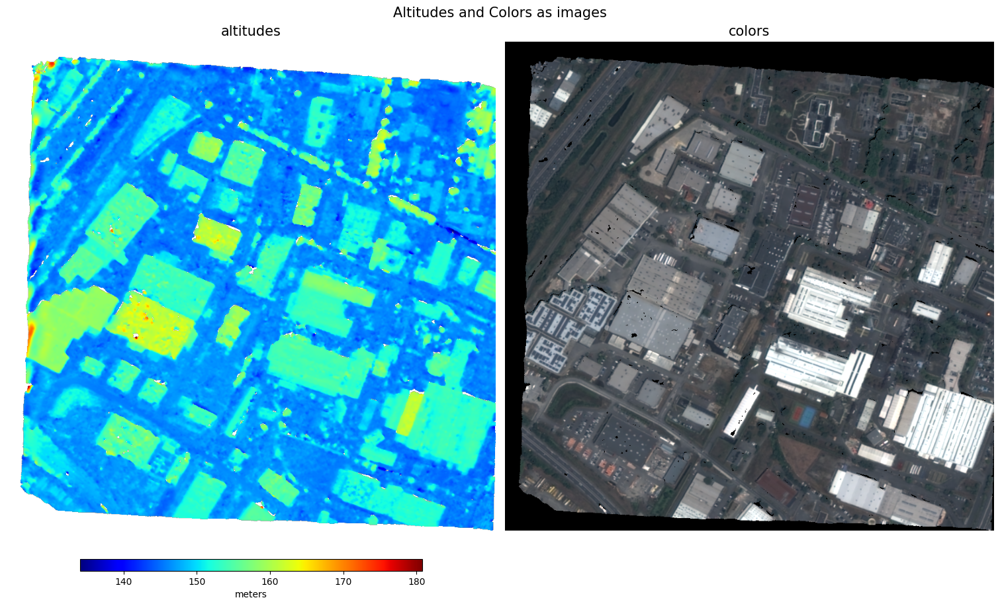

In [ ]:
%matplotlib inline
from matplotlib import pyplot

fig, (ax1, ax2) = pyplot.subplots(nrows=1, ncols=2, figsize=(15, 9),
                              constrained_layout=True)

fig.suptitle("Altitudes and Colors as images", fontsize=15)
im1 = ax1.imshow(altitudes, cmap='jet', aspect="auto")
ax1.axis('off')
ax1.set_title('altitudes', fontsize=15)
ax2.imshow(normalize(image/2**12), aspect="auto")
ax2.axis('off')
ax2.set_title('colors', fontsize=15)
fig.colorbar(im1, ax=ax1, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
pyplot.show()

##### Scatter (3D)

In [ ]:
import plotly.graph_objects as go

inds = np.random.choice(range(cloud.shape[0]), 20000)
x = cloud[inds, 0]
y = cloud[inds, 1]
z = cloud[inds, 2]

layout = go.Layout(scene=dict(aspectmode="data"),
                   height=600, width=1200,
                   title=go.layout.Title(text="Points Cloud Viewer"))
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z,
                                   mode='markers',
                                   marker=dict(
                                   size=2.5,
                                   color=z,
                                   colorscale='jet'))],
                layout=layout)
fig.show()

##### Check epipolar images

Resolution 16

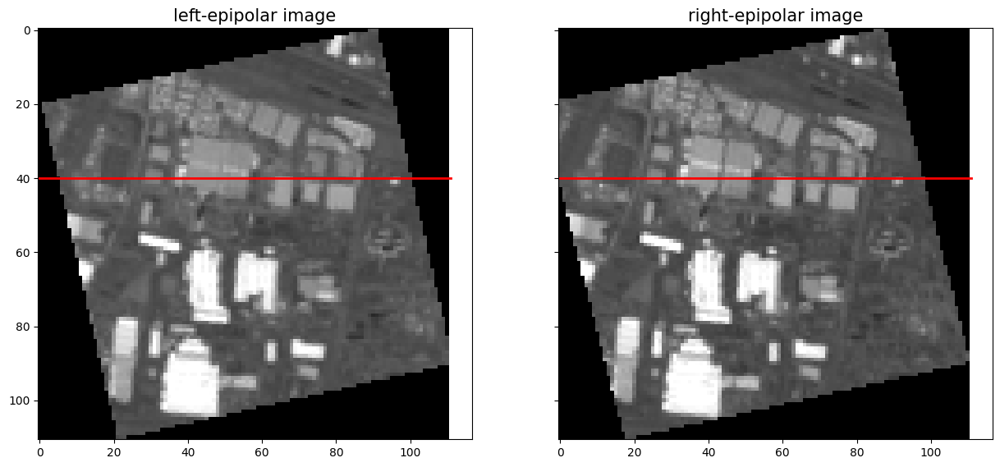

In [ ]:
epi_img_left_path = out+"intermediate_data/surface_modeling/res16/dump_dir/resampling/corrected_grid/img1_img2/epi_img_left.tif"
epi_img_right_path = out+"intermediate_data/surface_modeling/res16/dump_dir/resampling/corrected_grid/img1_img2/epi_img_right.tif"

line16 = 40

epi_img_left = rasterio.open(epi_img_left_path).read(1)
epi_img_right = rasterio.open(epi_img_right_path).read(1)

fig1, (ax1, ax2) = pyplot.subplots(1,2, sharex=True, sharey=True,  figsize=(15,9))
ax1.imshow(normalize(epi_img_left), cmap='gray')
ax2.imshow(normalize(epi_img_right), cmap='gray')
ax1.set_title('left-epipolar image', fontsize=15)
ax2.set_title('right-epipolar image', fontsize=15)
ax1.plot([0, epi_img_right.shape[0]], [line16,line16], color="red", linewidth=2)
ax2.plot([0, epi_img_right.shape[0]], [line16,line16], color="red", linewidth=2)
pyplot.show()

Resolution 4

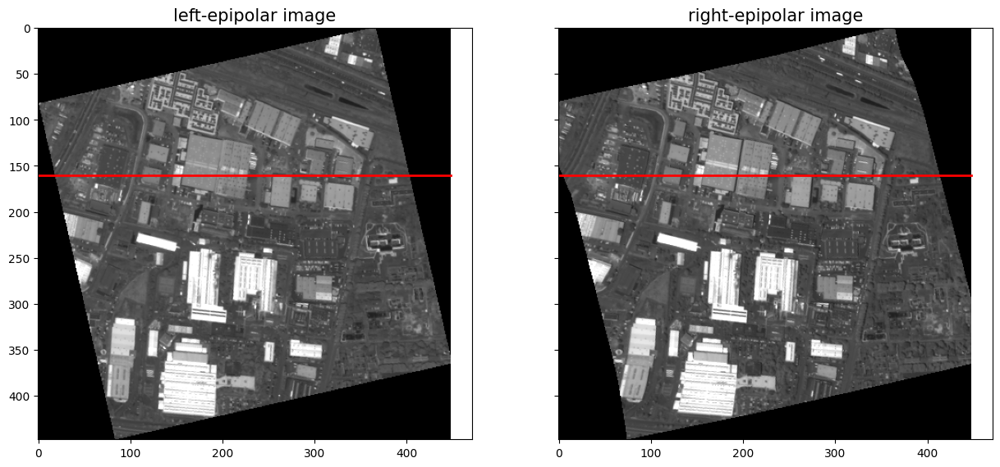

In [ ]:
epi_img_left_path = out+"intermediate_data/surface_modeling/res4/dump_dir/resampling/corrected_grid/img1_img2/epi_img_left.tif"
epi_img_right_path = out+"intermediate_data/surface_modeling/res4/dump_dir/resampling/corrected_grid/img1_img2/epi_img_right.tif"

line4 = line16 * 4

epi_img_left = rasterio.open(epi_img_left_path).read(1)
epi_img_right = rasterio.open(epi_img_right_path).read(1)

fig1, (ax1, ax2) = pyplot.subplots(1,2, sharex=True, sharey=True,  figsize=(15,9))
ax1.imshow(normalize(epi_img_left), cmap='gray')
ax2.imshow(normalize(epi_img_right), cmap='gray')
ax1.set_title('left-epipolar image', fontsize=15)
ax2.set_title('right-epipolar image', fontsize=15)
ax1.plot([0, epi_img_right.shape[0]], [line4,line4], color="red", linewidth=2)
ax2.plot([0, epi_img_right.shape[0]], [line4,line4], color="red", linewidth=2)
pyplot.show()

Resolution 1

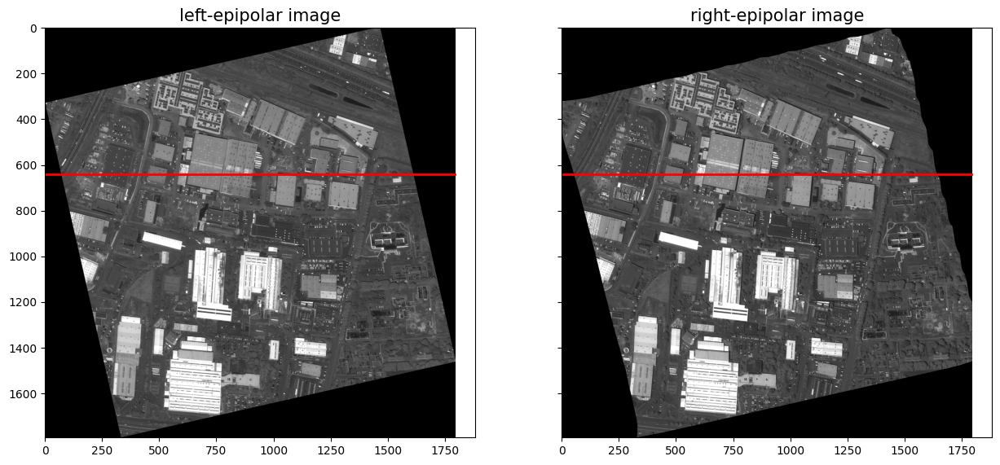

In [ ]:
epi_img_left_path = out+"intermediate_data/surface_modeling/res1/dump_dir/resampling/corrected_grid/img1_img2/epi_img_left.tif"
epi_img_right_path = out+"intermediate_data/surface_modeling/res1/dump_dir/resampling/corrected_grid/img1_img2/epi_img_right.tif"

line1 = line4 * 4

epi_img_left = rasterio.open(epi_img_left_path).read(1)
epi_img_right = rasterio.open(epi_img_right_path).read(1)

fig1, (ax1, ax2) = pyplot.subplots(1,2, sharex=True, sharey=True,  figsize=(15,9))
ax1.imshow(normalize(epi_img_left), cmap='gray')
ax2.imshow(normalize(epi_img_right), cmap='gray')
ax1.set_title('left-epipolar image', fontsize=15)
ax2.set_title('right-epipolar image', fontsize=15)
ax1.plot([0, epi_img_right.shape[0]], [line1,line1], color="red", linewidth=2)
ax2.plot([0, epi_img_right.shape[0]], [line1,line1], color="red", linewidth=2)
pyplot.show()

##### Print DSM for each resolution

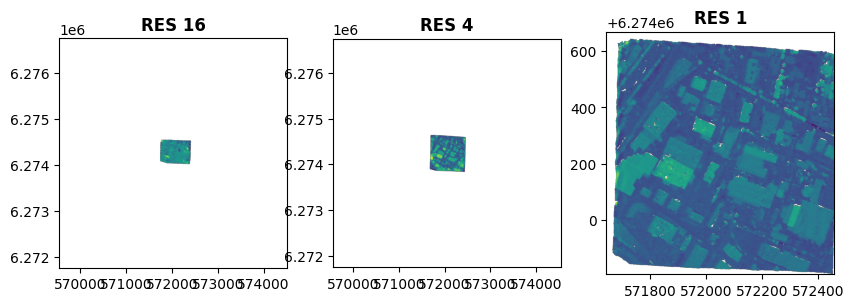

In [ ]:
from rasterio.plot import show

fig, axs = pyplot.subplots(1, 3, figsize=(10,10))

with rasterio.open(out+"intermediate_data/surface_modeling/res16/dsm/dsm.tif") as src:
    dsm16 = src.read()
    nodata = src.nodata
    dsm16[dsm16==nodata] = np.nan
    show(dsm16, ax=axs[0], cmap='viridis', title="RES 16", transform=src.transform)

with rasterio.open(out+"intermediate_data/surface_modeling/res4/dsm/dsm.tif") as src:
    dsm4 = src.read()
    nodata = src.nodata
    dsm4[dsm4==nodata] = np.nan
    show(dsm4, ax=axs[1], cmap='viridis', title="RES 4", transform=src.transform)

with rasterio.open(out+"dsm/dsm.tif") as src:
    dsm1 = src.read()
    nodata = src.nodata
    dsm1[dsm1==nodata] = np.nan
    show(dsm1, ax=axs[2], cmap='viridis', title="RES 1", transform=src.transform)

##### Visualize the performance map

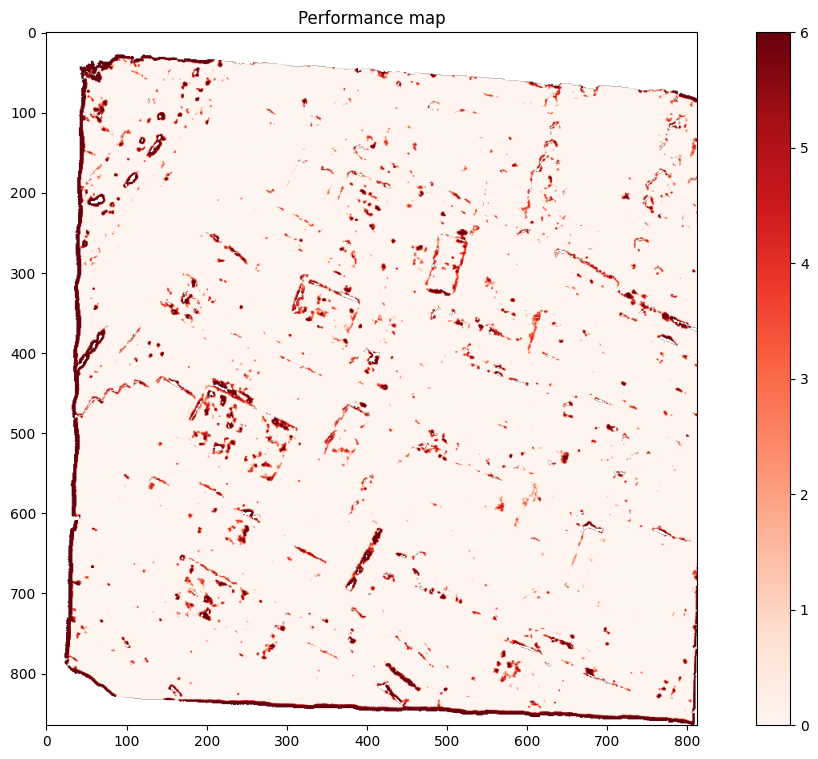

In [ ]:
performance_path = out+"dsm/performance_map.tif"

performance = rasterio.open(performance_path).read(1)
pyplot.figure(figsize = (15, 9))
pyplot.imshow(np.where(performance==255, np.nan, performance), cmap='Reds') # nodata value = 255
pyplot.title("Performance map")
pyplot.colorbar()
pyplot.show()

##### Visualize the ambiguity

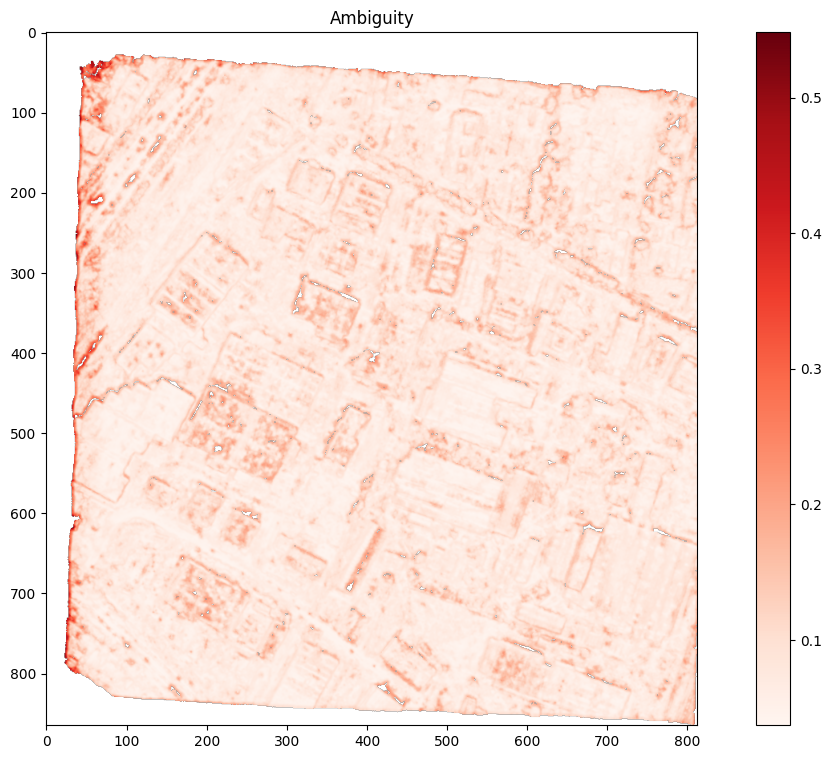

In [ ]:
ambiguity_path = out+"dsm/ambiguity.tif"

ambiguity = rasterio.open(ambiguity_path).read(1)
pyplot.figure(figsize = (15, 9))
pyplot.imshow(np.where(ambiguity==255, np.nan, ambiguity), cmap='Reds') # nodata value = 255
pyplot.title("Ambiguity")
pyplot.colorbar()
pyplot.show()

Use this command to merged point clouds files together

In [ ]:
# !laszip -i ROI_INDUS/DSM/point_cloud/img1_img2/*.laz -merged -o merged.laz

### Part 1.2: With land cover maps: ROI_STADIUM

In [ ]:
path_stadium = "ROI_STADIUM/"

In [ ]:
sensors = dict()
sensors["img1"] = {"image": path_stadium+"img1/stack.tif",
                   "geomodel":path_indus+"img1/RPC_PAN.XML",
                   "classification":path_stadium+"img1/out/stackmask_first_band.tif"}
sensors["img2"] = {"image": path_stadium+"img2/stack.tif",
                   "geomodel":path_indus+"img2/RPC_PAN.XML",
                   "classification": path_stadium+"img2/out/stackmask_first_band.tif"}
pairing = list()
pairing.append(["img1", "img2"])

# fill the water zones
filling = {"fill_with_geoid": 7, # sea
           "interpolate_from_borders": 8, # lake
           "fill_with_endogenous_dem": 9} # river

inputs = {"sensors": sensors, "pairing": pairing, "filling": filling}

# activate filling
surface_modeling = dict()
applications = dict()
applications["1"] = {"auxiliary_filling": {"activated": True, "mode": "full", "use_mask": False}}
surface_modeling["applications"] = applications

# do not run the subsampling for resolution 16 and 4, only 1
#subsampling = dict()
#subsampling["advanced"] = {"resolutions" : [1]}

config = {}
config["input"] = inputs
config["surface_modeling"] = surface_modeling
#config["subsampling"] = subsampling
config["orchestrator"] = {"mode": "multiprocessing", "max_ram_per_worker": 500}
config["output"] = {"directory": out,
                    "auxiliary": {"image": ["b1", "b2", "b3"], "classification": True, "performance_map": True, "filling": True, "contributing_pair": True},
                    "geoid": True,
                    "resolution": 1.0,
                    "epsg": 2154}

In [ ]:
!rm -rf "ROI_STADIUM/DSM/"

In [ ]:
out= path_stadium+"DSM/"

#### Create your configuration file

Stack PAN and PXS files

In [ ]:
import rasterio
import numpy as np

for idx in range(3):

    with rasterio.open(path_stadium+"img"+str(idx+1)+"/PAN.tif") as src1:
      PAN = src1.read(1)
      profile = src1.profile

    with rasterio.open(path_stadium+"img"+str(idx+1)+"/PXS.tif") as src2:
      PXS = src2.read()

    stacked_bands = np.stack((PAN, PXS[0], PXS[1], PXS[2]))

    profile.update(count=4)

    # Write the stacked bands to a new raster file
    with rasterio.open(path_stadium+"img"+str(idx+1)+"/stack.tif", 'w', **profile) as dst:
        dst.write(stacked_bands)


Create YAML file

In [ ]:
import yaml

with open("config_cars.yml", 'w') as file:
    yaml.dump(config, file)

In [ ]:
!cat config_cars.yml

input:
  filling:
    fill_with_endogenous_dem: 9
    fill_with_geoid: 7
    interpolate_from_borders: 8
  pairing:
  - - img1
    - img2
  sensors:
    img1:
      classification: ROI_STADIUM/img1/out/stackmask_first_band.tif
      geomodel: ROI_INDUS/img1/RPC_PAN.XML
      image: ROI_STADIUM/img1/stack.tif
    img2:
      classification: ROI_STADIUM/img2/out/stackmask_first_band.tif
      geomodel: ROI_INDUS/img2/RPC_PAN.XML
      image: ROI_STADIUM/img2/stack.tif
orchestrator:
  max_ram_per_worker: 500
  mode: multiprocessing
  nb_workers: 1
output:
  auxiliary:
    classification: true
    contributing_pair: true
    filling: true
    image:
    - b1
    - b2
    - b3
    performance_map: true
  directory: ROI_STADIUM/DSM/
  epsg: 2154
  geoid: true
  resolution: 1.0
surface_modeling:
  applications:
    '1':
      auxiliary_filling:
        activated: true
        mode: full
        use_mask: false


#### Launch CARS - Command line

2026-01-26 15:44:04,593 :: PROGRESS ::  Check configuration...
2026-01-26 15:44:04,600 :: WARNING ::  Input classif has classes over 10Classification file will be read to determine exact values
2026-01-26 15:44:10,571 :: PROGRESS ::  CARS pipeline is started.
2026-01-26 15:44:10,992 :: PROGRESS ::  Starting subsampling pipeline
2026-01-26 15:44:18,287 :: PROGRESS ::  Data list to process: [ subsampling_classif_res_16 , subsampling_classif_res_4 , subsampling_im_res_4 , subsampling_im_res_16 ] ...
Tiles processing: 100% 4/4 [00:01<00:00,  2.52it/s]
2026-01-26 15:44:23,784 :: PROGRESS ::  Starting surface modeling pipeline for resolution 1/16
2026-01-26 15:44:28,046 :: PROGRESS ::  Data list to process: [ epi_matches_left ] ...
Tiles processing: 100% 2/2 [00:01<00:00,  1.44it/s]
2026-01-26 15:44:29,544 :: WARNING ::  Insufficient amount of matches found (89 < 90), can not safely estimate epipolar error correction  and disparity range
2026-01-26 15:44:29,544 :: WARNING ::  Grid correction

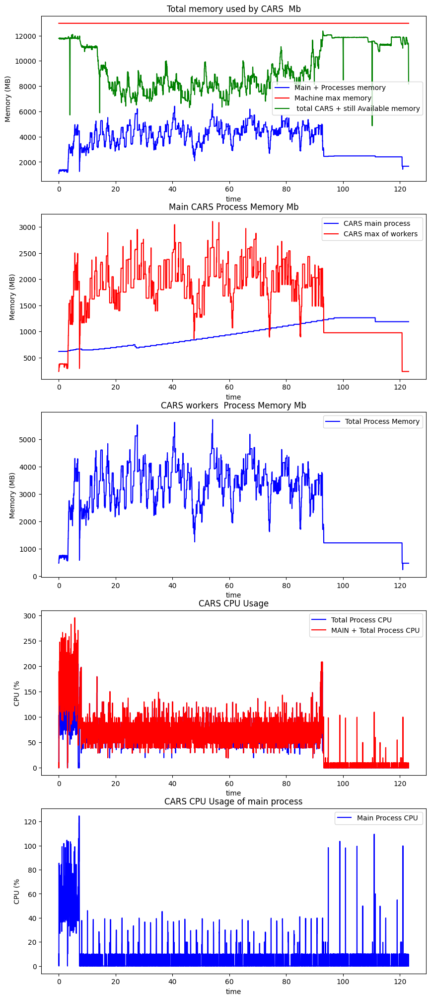

In [ ]:
!cars config_cars.yml

#### Let's see the results

##### Open & format output data

In [ ]:
import rasterio
import numpy as np

with rasterio.open(out+"/dsm/dsm.tif") as dsm_reader:
  altitudes = dsm_reader.read(1)
  transform = dsm_reader.transform
  width, height = dsm_reader.width, dsm_reader.height
  cols, rows = np.meshgrid(np.arange(width), np.arange(height))

  # get coordinates to plot points cloud
  x_coords, y_coords = rasterio.transform.xy(transform, rows, cols, offset='center')
  x_coords = np.ravel(x_coords).T
  y_coords = np.ravel(y_coords).T
  z_coords = altitudes.reshape(-1).T

with rasterio.open(out+"/dsm/image.tif") as clr_reader:
  image = clr_reader.read().astype(float)
  image = image[:3,:,:].transpose(1,2,0)
  nodata = clr_reader.nodata
  image[image==nodata] = np.nan

nodata = dsm_reader.nodata
# stack coords as points cloud
cloud = np.stack((x_coords, y_coords, z_coords), axis=1)
valid = cloud[:, 2] != nodata
cloud = cloud[valid]

# remove nodata altitudes
altitudes[altitudes==nodata] = np.nan

##### Results visualization (2D)

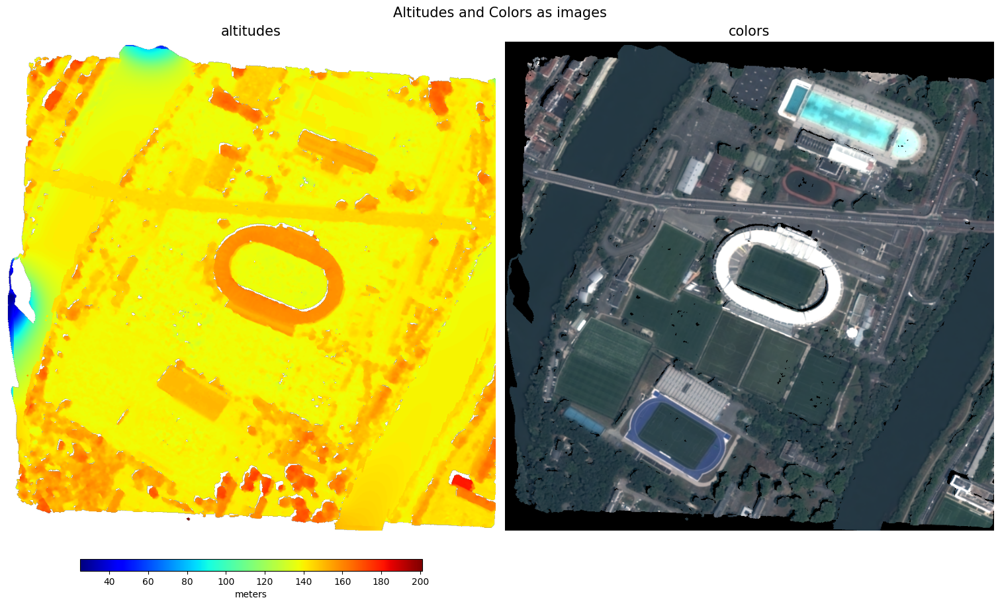

In [ ]:
from matplotlib import pyplot

fig, (ax1, ax2) = pyplot.subplots(nrows=1, ncols=2, figsize=(15, 9),
                              constrained_layout=True)

fig.suptitle("Altitudes and Colors as images", fontsize=15)
im1 = ax1.imshow(altitudes, cmap='jet', aspect="auto")
ax1.axis('off')
ax1.set_title('altitudes', fontsize=15)
ax2.imshow(normalize(image/2**12), aspect="auto")
ax2.axis('off')
ax2.set_title('colors', fontsize=15)
fig.colorbar(im1, ax=ax1, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
pyplot.show()

##### Scatter (3D)

In [ ]:
import plotly.graph_objects as go

inds = np.random.choice(range(cloud.shape[0]), 20000)
x = cloud[inds, 0]
y = cloud[inds, 1]
z = cloud[inds, 2]

layout = go.Layout(scene=dict(aspectmode="data"),
                   height=600, width=1200,
                   title=go.layout.Title(text="Points Cloud Viewer"))
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z,
                                   mode='markers',
                                   marker=dict(
                                   size=2.5,
                                   color=z,
                                   colorscale='jet'))],
                layout=layout)
fig.show()

Tiles processing:   6%|▌         | 2/36 [2:16:48<38:45:36, 4104.02s/it]


##### Visualize the performance map

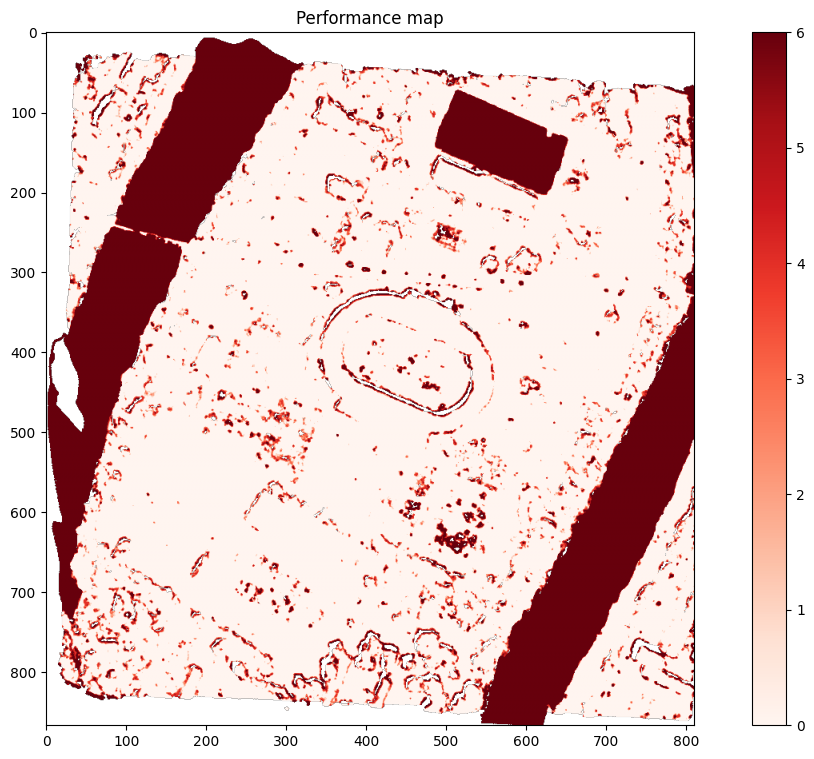

In [ ]:
performance_path = out+"dsm/performance_map.tif"

performance = rasterio.open(performance_path).read(1)
pyplot.figure(figsize = (15, 9))
pyplot.imshow(np.where(performance==255, np.nan, performance), cmap='Reds') # nodata value = 255
pyplot.title("Performance map")
pyplot.colorbar()
pyplot.show()

##### Visualize the classification

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

colors = [
    '#ffffff',  # inconnu (0)
    '#18df2f',  # Veg basse (1)
    '#0f7637',  # Veg haute (2)
    '#2895cb',  # Eau (3)
    '#ff0184',  # Bati (4)
    '#ddc823',  # Sol nu (6)
    '#185880',  # Mer/Océan (7)
    '#64ebe0',  # Lac (8)
    '#149ceb'   # Rivière (9)
]

stackmask_style = ListedColormap(colors, name='stackmask_style')
bounds = [0, 1, 2, 3, 4, 6, 7, 8, 9, 10]
norm = BoundaryNorm(bounds, stackmask_style.N)

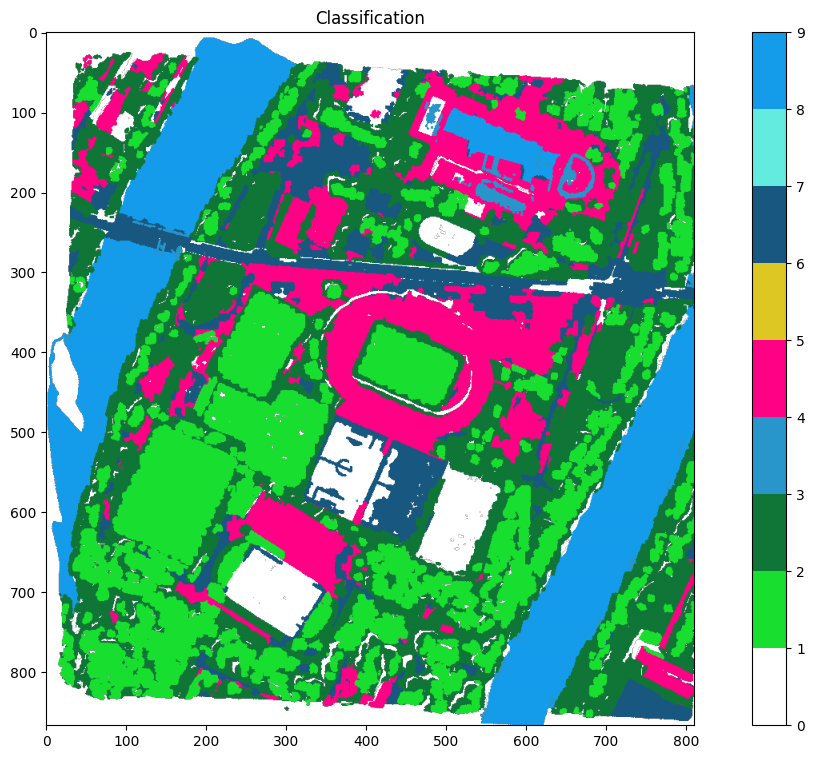

In [ ]:
classification_path = out+"dsm/classification.tif"

classification = rasterio.open(classification_path).read(1)
pyplot.figure(figsize = (15, 9))
pyplot.imshow(np.where(classification==255, np.nan, classification), cmap=stackmask_style) # nodata value = 255
pyplot.title("Classification")
pyplot.colorbar()
pyplot.show()

##### Visualize the filling

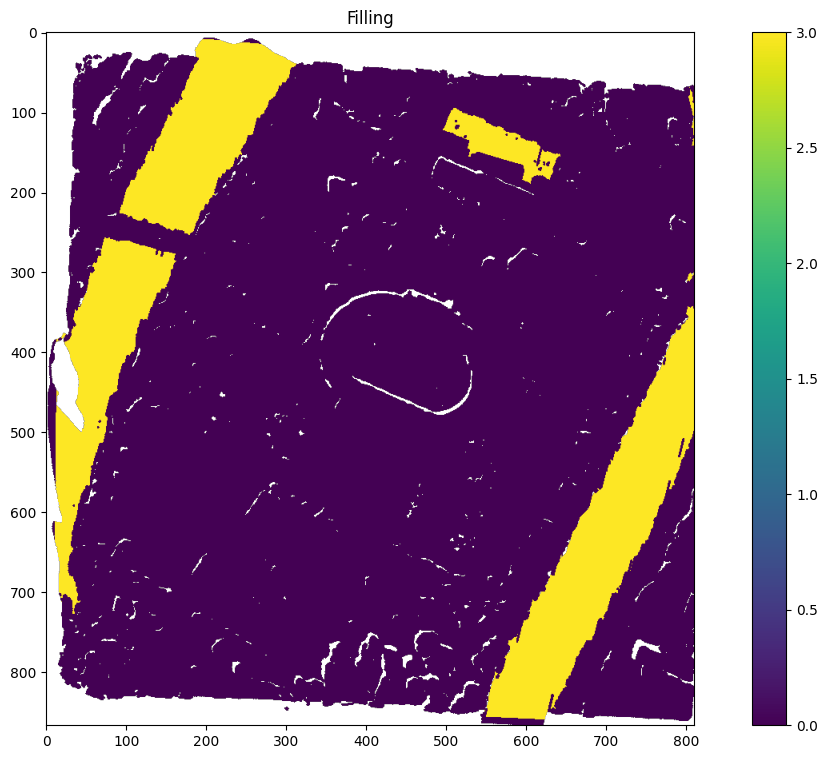

In [ ]:
filling_path = out+"dsm/filling.tif"

filling = rasterio.open(filling_path).read(1)
pyplot.figure(figsize = (15, 9))
pyplot.imshow(np.where(filling==255, np.nan, filling)) # nodata value = 255
pyplot.title("Filling")
pyplot.colorbar()
pyplot.show()
print(filling.descriptions)

Visualize the contributing pair

In [ ]:
contributing_path = out+"dsm/contributing_pair.tif"

contributing = rasterio.open(contributing_path).read(1)
pyplot.figure(figsize = (15, 9))
pyplot.imshow(np.where(contributing==255, np.nan, contributing)) # nodata value = 255
pyplot.title("Contributing pair")
pyplot.colorbar()
pyplot.show()

## Part 2: Extract the Digital Terrain Models from Digital Surface Models through the Bulldozer library

and derive a final Digital Height Model based on the obtained results : https://github.com/cnes/bulldozer


### Launch Bulldozer - Python API: ROI_INDUS

In [37]:
out = "ROI_INDUS/"

In [51]:
from bulldozer.pipeline.bulldozer_pipeline import dsm_to_dtm

dsm_to_dtm(dsm_path=out+"DSM/dsm/dsm.tif",
           output_dir=out+"DTM",
           nb_max_workers=1,
           max_object_size=32,
           generate_dhm = True)

Prevent unhook from hills...: 100%|██████████| 10/10 [00:00<00:00, 17697.49it/s]


Process level 4 ...
Drape cloth simulation...
Process level 3 ...
Drape cloth simulation...
Process level 2 ...
Drape cloth simulation...
Process level 1 ...
Drape cloth simulation...
Process level 0 ...
Drape cloth simulation...


#### Let's see the results

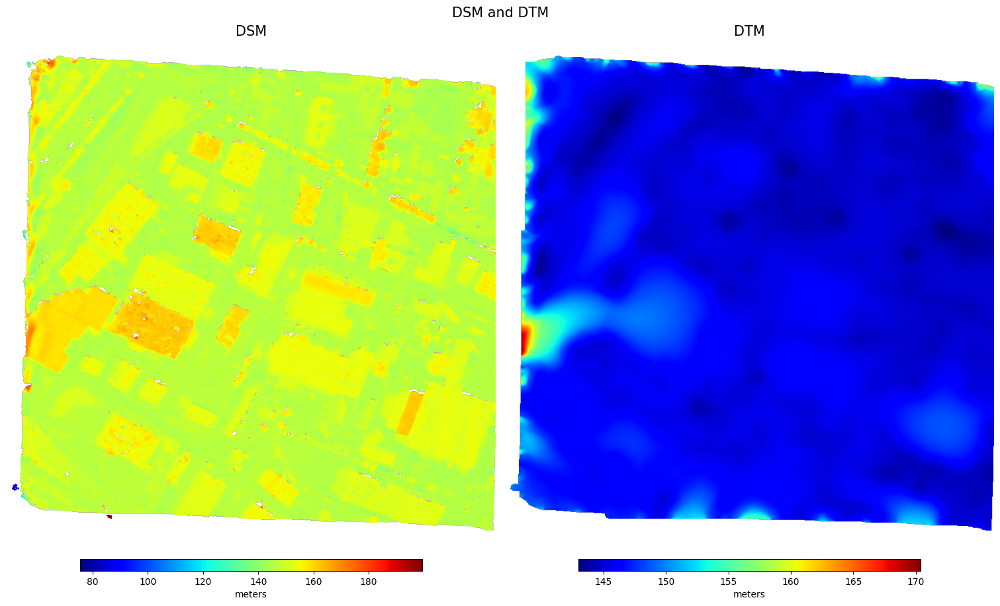

In [52]:
from matplotlib import pyplot

fig, (ax1, ax2) = pyplot.subplots(nrows=1, ncols=2, figsize=(15, 9),
                              constrained_layout=True)

fig.suptitle("DSM and DTM", fontsize=15)
with rasterio.open(out+"DSM/dsm/dsm.tif") as src:
  dsm = src.read(1)
  nodata = src.nodata
  dsm[dsm==nodata] = np.nan
im1 = ax1.imshow(dsm, cmap='jet', aspect="auto")
ax1.axis('off')
ax1.set_title('DSM', fontsize=15)
with rasterio.open(out+"DTM/dtm.tif") as src:
  dtm = src.read(1)
  nodata = src.nodata
  dtm[dtm==nodata] = np.nan
im2 = ax2.imshow(dtm, cmap='jet', aspect="auto")
ax2.axis('off')
ax2.set_title('DTM', fontsize=15)
fig.colorbar(im1, ax=ax1, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
fig.colorbar(im2, ax=ax2, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
pyplot.show()

DSM, DTM, DHM profiles

In [ ]:
row_number = 600
start_col = 300
end_col = 1300

from rasterio.windows import Window
fig, axs = pyplot.subplots(3,3, figsize=(20, 20))

gs = axs[1, 0].get_gridspec()

for ax in axs[1, 0:]:
    ax.remove()

for ax in axs[2, 0:]:
    ax.remove()

axdstm = fig.add_subplot(gs[1, 0:])
axdhm = fig.add_subplot(gs[2, 0:])

for idx, file in enumerate([out+"DSM/dsm/dsm.tif", out+"DTM/dtm.tif", out+"DTM/dhm.tif"]):
    with rasterio.open(file) as src:
        axs[0, idx].plot([start_col, end_col], [row_number, row_number],
                         color="red", linewidth=4)
        profiley = np.ravel(src.read(1, window=Window(start_col, row_number, end_col-start_col, 1)))
        profilex = np.arange(len(profiley))
        profilex = profilex[profiley!=src.nodata]
        profiley = profiley[profiley!=src.nodata]

        axdhm.plot(profilex, profiley, label=os.path.basename(out).lower())

        array = src.read(1)
        array[array==src.nodata] = np.nan
        axs[0, idx].imshow(array, cmap='gray')
        axs[0, idx].set_title(os.path.basename(file).lower())

axdstm.legend()
axdhm.legend()
pyplot.show()

### Launch Bulldozer - Command line: ROI_STADIUM

In [ ]:
out = "ROI_STADIUM/"

In [ ]:
import yaml
config = {"dsm_path": out+"DSM/dsm/dsm.tif",
           "output_dir": out+ "DTM",
           "nb_max_workers": 1}

with open("config_bulldozer.yml", "w") as f:
    yaml.dump(config, f)

In [ ]:
!cat config_bulldozer.yml

dsm_path: ROI_STADIUM/DSM/dsm/dsm.tif
nb_max_workers: 1
output_dir: ROI_STADIUM/DTM
uniform_filter_size: 3


In [ ]:
!bulldozer --conf config_bulldozer.yml

Build Disturbance Mask: 100% 1/1 [00:00<00:00, 24.07it/s]
=15:04:47 [INFO] logging_helper - disturbance mask: Done
Build Horizontal Border NoData Mask: 100% 1/1 [00:00<00:00, 17.36it/s]
Build Vertical Border NoData Mask: 100% 1/1 [00:00<00:00, 21.82it/s]
=15:04:47 [INFO] logging_helper - bulldozer.preprocessing.dsm_preprocess-build_border_nodata_mask: Done (Runtime: 0.15s)
=15:04:47 [INFO] logging_helper - inner_nodata_mask and border_nodata_mask generation: Done
Filling DSM nodata...: 100% 1/1 [00:00<00:00,  7.07it/s]
=15:04:47 [INFO] logging_helper - Preprocess done
=15:04:47 [INFO] logging_helper - Starting dtm extraction by Cloth simulation
Prevent unhook from hills...: 100% 10/10 [00:00<00:00, 6169.00it/s]
=15:04:47 [INFO] logging_helper - Process level 4...
=15:04:47 [INFO] logging_helper - Process level 3...
=15:04:47 [INFO] logging_helper - Process level 2...
=15:04:47 [INFO] logging_helper - Process level 1...
=15:04:48 [INFO] logging_helper - Process level 0...
=15:04:49 [INF

#### Let's see the results

In [ ]:
from matplotlib import pyplot

fig, (ax1, ax2) = pyplot.subplots(nrows=1, ncols=2, figsize=(15, 9),
                              constrained_layout=True)

fig.suptitle("DSM and DTM", fontsize=15)
with rasterio.open(out+"DSM/dsm/dsm.tif") as src:
  dsm = src.read(1)
  nodata = src.nodata
  dsm[dsm==nodata] = np.nan
im1 = ax1.imshow(dsm, cmap='jet', aspect="auto")
ax1.axis('off')
ax1.set_title('DSM', fontsize=15)
with rasterio.open(out+"DTM/dtm.tif") as src:
  dtm = src.read(1)
  nodata = src.nodata
  dtm[dtm==nodata] = np.nan
im2 = ax2.imshow(dtm, cmap='jet', aspect="auto")
ax2.axis('off')
ax2.set_title('DTM', fontsize=15)
fig.colorbar(im1, ax=ax1, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
fig.colorbar(im2, ax=ax2, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
pyplot.show()

###

## Part 3: Compare CARS DSMs with LiDAR HD
using the xDEM library : https://github.com/GlacioHack/xdem

### Visualize LiDAR HD data

*LiDAR HD point clouds can be downloaded using the web site : [point cloud](https://cartes.gouv.fr/telechargement/IGNF_NUAGES-DE-POINTS-LIDAR-HD) and LiDAR HD MNS can be downloaded using the web site : [MNS](https://cartes.gouv.fr/telechargement/IGNF_MNS-LIDAR-HD)*



In both areas, LiDAR HD data was acquired between 28/05/2022 and 01/06/2022.

In [ ]:
from matplotlib import pyplot

fig, (ax1, ax2) = pyplot.subplots(nrows=1, ncols=2, figsize=(15, 9),
                              constrained_layout=True)

fig.suptitle("ROI_STADIUM and ROI_INDUS", fontsize=15)
with rasterio.open("ROI_STADIUM/LIDAR_HD/MNS_LIDAR_HD.tif") as src:
  dsm = src.read(1)
  nodata = src.nodata
  dsm[dsm==nodata] = np.nan
im1 = ax1.imshow(dsm, cmap='jet', aspect="auto")
ax1.axis('off')
ax1.set_title('DSM', fontsize=15)
with rasterio.open(out+"ROI_INDUS/LIDAR_HD/MNS_LIDAR_HD.tif") as src:
  dtm = src.read(1)
  nodata = src.nodata
  dtm[dtm==nodata] = np.nan
im2 =ax2.imshow(dtm, cmap='jet', aspect="auto")
ax2.axis('off')
ax2.set_title('DTM', fontsize=15)
fig.colorbar(im1, ax=ax1, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
fig.colorbar(im2, ax=ax2, shrink=0.7, aspect=30, orientation="horizontal", label="meters")
pyplot.show()

### Launch xDEM - Python API : ROI_INDUS

In [1]:
out = "ROI_INDUS/"

Load images

In [ ]:
import xdem

ref=out+"LIDAR_HD/MNS_LIDAR_HD.tif"
sec=out+"DSM/dsm/dsm.tif"
input_ref = xdem.DEM(ref)
input_sec = xdem.DEM(sec)

Get info and stats for each image

In [ ]:
input_ref.info(stats=True)

Driver:               GTiff 
Opened from file:     ROI_INDUS/MNS_LIDAR_HD.tif 
Filename:             ROI_INDUS/MNS_LIDAR_HD.tif 
Loaded?               True 
Modified since load?  False 
Grid size:            1622, 1699
Number of bands:      1
Data types:           float32
Coordinate system:    ['PROJCS["EPSG:2154",GEOGCS["unknown",DATUM["unnamed",SPHEROID["unretrievable - using WGS84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",46.5],PARAMETER["central_meridian",3],PARAMETER["standard_parallel_1",49],PARAMETER["standard_parallel_2",44],PARAMETER["false_easting",700000],PARAMETER["false_northing",6600000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]', 'None']
Nodata value:         -9999.0
Pixel interpretation: Area
Pixel size:           0.5, 0.5
Upper left corner:    571662.75, 6274648.75
Lower right corner:   572

In [ ]:
input_sec.info(stats=True)

Driver:               None 
Opened from file:     None 
Filename:             None 
Loaded?               True 
Modified since load?  True 
Grid size:            1622, 1699
Number of bands:      1
Data types:           float32
Coordinate system:    ['PROJCS["EPSG:2154",GEOGCS["unknown",DATUM["unnamed",SPHEROID["unretrievable - using WGS84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",46.5],PARAMETER["central_meridian",3],PARAMETER["standard_parallel_1",49],PARAMETER["standard_parallel_2",44],PARAMETER["false_easting",700000],PARAMETER["false_northing",6600000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]', 'None']
Nodata value:         -32768.0
Pixel interpretation: Area
Pixel size:           0.5, 0.5
Upper left corner:    571662.75, 6274648.75
Lower right corner:   572473.75, 6273799.25

Statistics:
Mean         

Reproject the CARS MNS on the LiDAR HD

In [ ]:
input_sec = input_sec.reproject(input_ref)

Altitude difference before coregistration

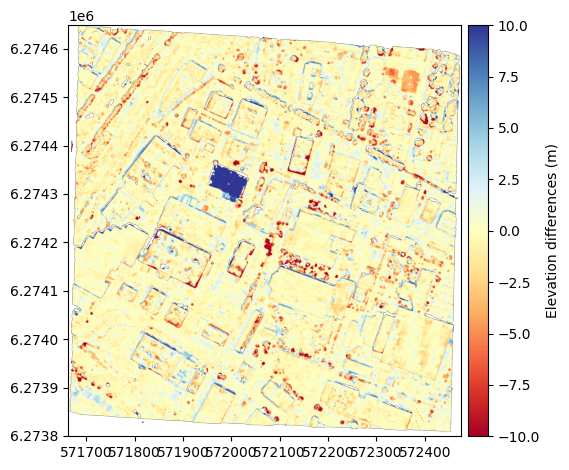

In [ ]:
altitude_diff = input_sec - input_ref
altitude_diff.plot(cmap="RdYlBu", vmin=-10, vmax=10, cbar_title="Elevation differences (m)")

Compute stats on the difference

In [ ]:
altitude_diff.get_stats()

{'Mean': np.float64(-0.15926679964564364),
 'Median': np.float32(-0.105773926),
 'Max': np.float32(49.56859),
 'Min': np.float32(-49.474823),
 'Sum': np.float32(-389766.3),
 'Sum of squares': np.float32(12888219.0),
 '90th percentile': np.float64(1.380030822753909),
 'LE90': np.float64(5.71888809204101),
 'IQR': np.float64(1.2024383544921875),
 'NMAD': np.float32(0.8910282),
 'RMSE': np.float64(2.294863877960346),
 'Standard deviation': np.float64(2.289330086516642),
 'Valid count': 2447254,
 'Total count': 2755778,
 'Percentage valid points': 88.80446828445542}

Compute coregistration

In [ ]:
nuth_kaab = xdem.coreg.NuthKaab()
aligned_dem = nuth_kaab.fit_and_apply(input_ref, input_sec)

   Progress:   0%|          | 0/10 [00:00<?, ?it/s]

      Iteration #1 - Offset: (np.float64(0.1302367716342612), np.float64(0.02903370467778509), 0.10479736328125); Magnitude: 0.2668675528649487
      Iteration #2 - Offset: (np.float64(0.23102701435231737), np.float64(0.054999659238359054), 0.10371991341540365); Magnitude: 0.20816247330781276
      Iteration #3 - Offset: (np.float64(0.31063684827046995), np.float64(0.07608623236478233), 0.10362471926495687); Magnitude: 0.16471028167897514
      Iteration #4 - Offset: (np.float64(0.365520576262446), np.float64(0.09061381142641035), 0.10536183291154089); Magnitude: 0.11354777235488278
      Iteration #5 - Offset: (np.float64(0.4091879092459607), np.float64(0.09996850677384873), 0.10479046279141357); Magnitude: 0.08931620894186093
      Iteration #6 - Offset: (np.float64(0.4417877120769368), np.float64(0.10595140432551135), 0.10465420651740942); Magnitude: 0.06628852714406037
      Iteration #7 - Offset: (np.float64(0.4669774572906756), np.float64(0.10852740654869003), 0.10444737722923492

Altitude difference after coregistration

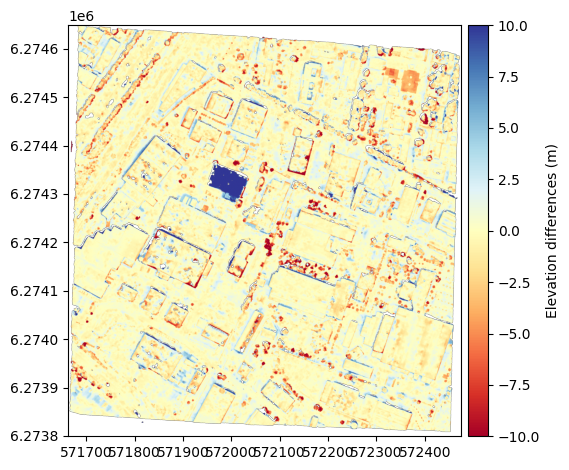

In [ ]:
altitude_diff_after_coreg = aligned_dem - input_ref
altitude_diff_after_coreg.plot(cmap="RdYlBu", vmin=-10, vmax=10, cbar_title="Elevation differences (m)")

Compute terrain attributes on CARS MNS

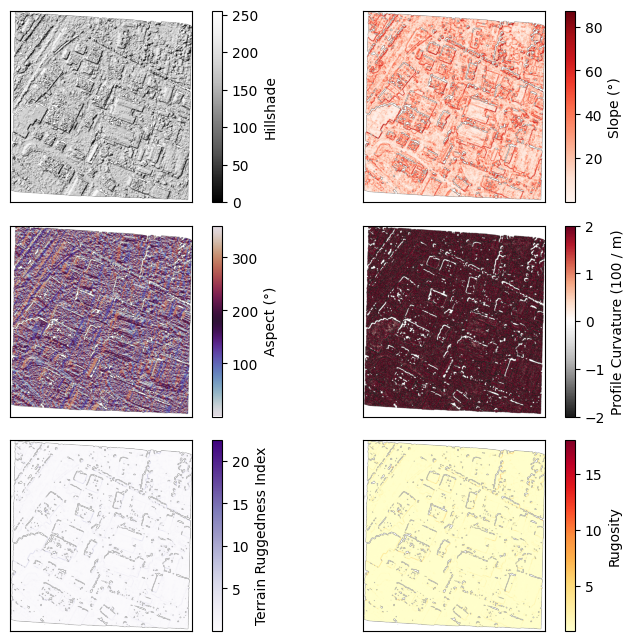

In [ ]:
import matplotlib.pyplot as plt

attributes = xdem.terrain.get_terrain_attribute(
    input_sec.data,
    resolution=input_ref.res,
    attribute=["hillshade", "slope", "aspect", "profile_curvature", "terrain_ruggedness_index", "rugosity"],
)

plt.figure(figsize=(8, 6.5))

plt_extent = [input_sec.bounds.left, input_sec.bounds.right, input_sec.bounds.bottom, input_sec.bounds.top]

cmaps = ["Greys_r", "Reds", "twilight", "RdGy_r", "Purples", "YlOrRd"]
labels = ["Hillshade", "Slope (°)", "Aspect (°)", "Profile Curvature (100 / m)", "Terrain Ruggedness Index", "Rugosity"]
vlims = [(None, None) for i in range(6)]
vlims[3] = [-2, 2]

for i in range(6):
    plt.subplot(3, 2, i + 1)
    plt.imshow(attributes[i].squeeze(), cmap=cmaps[i], extent=plt_extent, vmin=vlims[i][0], vmax=vlims[i][1])
    cbar = plt.colorbar()
    cbar.set_label(labels[i])
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()
plt.show()

Compute terrain attributes on LiDAR HD MNS

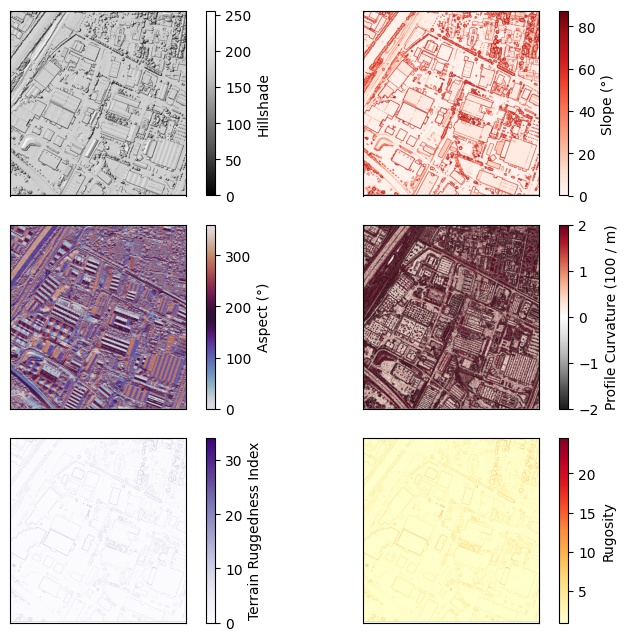

In [ ]:
import matplotlib.pyplot as plt

attributes = xdem.terrain.get_terrain_attribute(
    input_ref.data,
    resolution=input_ref.res,
    attribute=["hillshade", "slope", "aspect", "profile_curvature", "terrain_ruggedness_index", "rugosity"],
)

plt.figure(figsize=(8, 6.5))

plt_extent = [input_ref.bounds.left, input_ref.bounds.right, input_ref.bounds.bottom, input_ref.bounds.top]

cmaps = ["Greys_r", "Reds", "twilight", "RdGy_r", "Purples", "YlOrRd"]
labels = ["Hillshade", "Slope (°)", "Aspect (°)", "Profile Curvature (100 / m)", "Terrain Ruggedness Index", "Rugosity"]
vlims = [(None, None) for i in range(6)]
vlims[3] = [-2, 2]

for i in range(6):
    plt.subplot(3, 2, i + 1)
    plt.imshow(attributes[i].squeeze(), cmap=cmaps[i], extent=plt_extent, vmin=vlims[i][0], vmax=vlims[i][1])
    cbar = plt.colorbar()
    cbar.set_label(labels[i])
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()
plt.show()

### Launch xDEM - Command Line: ROI_STADIUM

In [ ]:
!pip install xdem[opt]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 710.3/710.3 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.7/319.7 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 649.3/649.3 kB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 76.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 847.1/847.1 kB 52.8 MB/s eta 0:00:00
  Attempting uninstall: tinycss2
    Found existing installation: tinycss2 1.4.0
    Uninstalling tinycss2-1.4.0:
      Successfully uninstalled tinycss2-1.4.0


In [ ]:
out = "ROI_STADIUM/"

#### Compare MNS CARS with LiDAR HD MNS

Print template configuration file for accuracy workflow

In [ ]:
!xdem accuracy --template-config

Create YAML file

In [ ]:
import yaml
config = {"inputs":
          {"reference_elev":
           {"path_to_elev": out+"LIDAR_HD/MNS_LIDAR_HD.tif"},
           "to_be_aligned_elev":
           {"path_to_elev": out+"DSM/dsm/dsm.tif"}},
          "outputs":
          {"path": out+"accuracy_workflow"}
          }

with open("accuracy_config.yml", "w") as f:
    yaml.dump(config, f)

In [ ]:
!cat accuracy_config.yml

inputs:
  reference_elev:
    path_to_elev: ROI_INDUS/MNS_LIDAR_HD.tif
  to_be_aligned_elev:
    path_to_elev: ROI_INDUS/DSM/dsm/dsm.tif


Launch accuracy workflow

In [ ]:
!xdem accuracy --config accuracy_config.yml

2026-01-23 15:08:02,493 - INFO - Running accuracy workflow
2026-01-23 15:08:03,298 - INFO - Outputs folder: /content/outputs
2026-01-23 15:08:03,299 - INFO - Outputs will be saved at outputs
2026-01-23 15:08:15,385 - INFO - Computing reprojection
2026-01-23 15:08:15,386 - INFO - CRS not geographic: data reprojection with EPSG:32631
2026-01-23 15:08:16,192 - INFO - Computing intersection
2026-01-23 15:08:18,136 - INFO - Running Nuth and Kääb (2011) coregistration
      Iteration #1 - Offset: (np.float64(0.1192065294076949), np.float64(0.025102172617491446), 0.1107330322265625); Magnitude: 0.24377820423367483
      Iteration #2 - Offset: (np.float64(0.2072364450408089), np.float64(0.040164993801285284), 0.11025886994926282); Magnitude: 0.17871873659484708
      Iteration #3 - Offset: (np.float64(0.2723930562638613), np.float64(0.05087020420360671), 0.1100387968779728); Magnitude: 0.13213437856231797
      Iteration #4 - Offset: (np.float64(0.31590763809296946), np.float64(0.0477562327006

#### Compute terrain attributes

Create YAML file

In [ ]:
import yaml
config = {"inputs":
          {"reference_elev":
           {"path_to_elev": out+"DSM/dsm/dsm.tif"}},
          "outputs":
          {"path": out+"topo_workflow"}
          }

with open("topo_config.yml", "w") as f:
    yaml.dump(config, f)

In [ ]:
!xdem topo --config topo_config.yml